## Tacotron 2 inference code 
Edit the variables **checkpoint_path** and **text** to match yours and run the entire code to generate plots of mel outputs, alignments and audio synthesis from the generated mel-spectrogram using Griffin-Lim.

#### Import libraries and setup matplotlib

In [1]:
import matplotlib

import matplotlib.pylab as plt

import IPython.display as ipd

import sys
sys.path.append('waveglow/')
import numpy as np
import torch

from hparams import create_hparams
from model import Tacotron2
from layers import TacotronSTFT, STFT
from audio_processing import griffin_lim
from train import load_model
from text import text_to_sequence
from denoiser import Denoiser

In [2]:
def plot_data(data, figsize=(16, 4)):
    fig, axes = plt.subplots(1, len(data), figsize=figsize)
    for i in range(len(data)):
        axes[i].imshow(data[i], aspect='auto', origin='lower', 
                       interpolation='none')

#### Setup hparams

In [3]:
hparams = create_hparams()

hparams.sampling_rate=22050
hparams.filter_length=1024
hparams.hop_length=256
hparams.win_length=1024
hparams.n_mel_channels=80
hparams.mel_fmin=0.0
hparams.mel_fmax=8000.0
hparams.global_mean = None
hparams.max_decoder_steps=2000

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



#### Load model from checkpoint

In [32]:
#checkpoint_path = "outdir/checkpoint_from_sirius"
checkpoint_path = "/home/ubuntu/voice_code/tacotron-mod/tacotron2/outdir/checkpoint_from_grid"
#checkpoint_path = "outdir/checkpoint_alcaim"
#checkpoint_path = "outdir/checkpoint_cadu"
#checkpoint_path = "/home/ubuntu/voice_data/saved_models_tacotron/tacotron_voz_base"
model = load_model(hparams)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
_ = model.cuda().eval().half()

#### Load WaveGlow for mel2audio synthesis and denoiser

In [26]:
#waveglow_path = '/home/ubuntu/voice_data/waveglow_256channels_universal_v5.pt'
#waveglow_path = 'outdir/waveglow_grid'
#waveglow_path = '/home/ubuntu/voice_code/waveglow/checkpoints/last_22050'
#waveglow_path = 'outdir/waveglow_alcaim'
#waveglow_path = 'outdir/waveglow_cadu'
waveglow_path = '/home/ubuntu/voice_code/waveglow/checkpoints/best_22050_base'
waveglow = torch.load(waveglow_path)['model']
waveglow.cuda().eval().half()
for k in waveglow.convinv:
    k.float()
denoiser = Denoiser(waveglow,filter_length=hparams.filter_length, n_overlap=4,
                 win_length=hparams.win_length, mode='zeros',n_mels=hparams.n_mel_channels)

#### Prepare text input

In [27]:
text = "A operação desta quarta nasceu de uma cooperação entre autoridades brasileiras e americanas."
sequence = np.array(text_to_sequence(text, ['basic_cleaners']))[None, :]
sequence = torch.autograd.Variable(
    torch.from_numpy(sequence)).cuda().long()

#### Decode text input and plot results

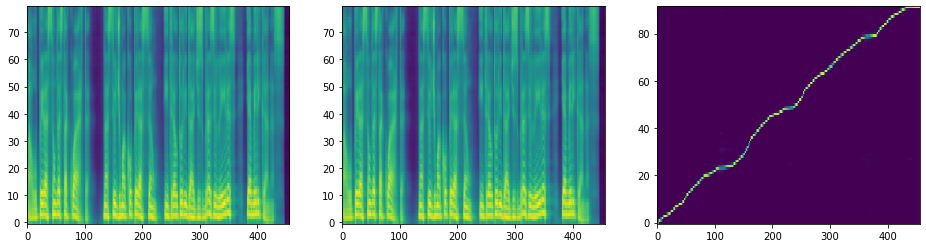

In [28]:
mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
%matplotlib inline
plot_data((mel_outputs.float().data.cpu().numpy()[0],
           mel_outputs_postnet.float().data.cpu().numpy()[0],
           alignments.float().data.cpu().numpy()[0].T))

#### Synthesize audio from spectrogram using WaveGlow

In [29]:
with torch.no_grad():
    audio = waveglow.infer(mel_outputs_postnet, sigma=1.0)
ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate)

#### (Optional) Remove WaveGlow bias

In [30]:
audio_denoised = denoiser(audio, strength=0.01)[:, 0]
ipd.Audio(audio_denoised.cpu().numpy(), rate=hparams.sampling_rate) 

In [25]:
with torch.no_grad():
    audio = waveglow.infer(mel_outputs_postnet, sigma=1.0)
audio_denoised = denoiser(audio, strength=0.01)[:, 0]
ipd.Audio(audio_denoised.cpu().numpy(), rate=hparams.sampling_rate) 

In [355]:
checkpoint_path = "outdir/checkpoint_from_sirius"
model = load_model(hparams)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
_ = model.cuda().eval().half()
waveglow_path = '/home/ubuntu/voice_code/waveglow/checkpoints/last_waveglow_lw'
waveglow = torch.load(waveglow_path)['model']
waveglow.cuda().eval().half()
for k in waveglow.convinv:
    k.float()
denoiser = Denoiser(waveglow,filter_length=hparams.filter_length, n_overlap=4,
                 win_length=hparams.win_length, mode='zeros',n_mels=hparams.n_mel_channels)
audios_lw= []
phrases = [
           'A operação desta quarta nasceu de uma cooperação entre autoridades brasileiras e americanas.',
           'A prefeitura de Curitiba diz que não tem mais doses para convocar novos grupos de idosos a partir da semana que vem.',
           'Eu tomando a vacina, eu estou preparado pro mundo que ele é, fala um senhor que foi vacinado.',
           'E o mais importante: fragmentos de texto bíblico de dois mil anos, com trechos do Antigo Testamento.',
           'Os ministros das Relações Exteriores da União Europeia pediram nesta terça um cessar-fogo.',
           'Auditores fiscais defendiam que, sem esse dinheiro, as fiscalizações ficariam prejudicadas.',
           'Um foguete atingiu uma fazenda no Sul de Israel, matando dois trabalhadores tailandeses.',
           'Do lado de fora, parentes de um dos réus comemoraram. Famílias das vítimas reclamaram.',
           'O Banco Central alerta a quem desconfiar que caiu numa fraude e está com uma pendência financeira.',
           'Por exemplo, o criminoso pega os dados pessoais de uma pessoa e depois vende as informações.'
          ]
        
for phrase in phrases:
    text = phrase
    sequence = np.array(text_to_sequence(text, ['basic_cleaners']))[None, :]
    sequence = torch.autograd.Variable(
        torch.from_numpy(sequence)).cuda().long()
    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
    audio = waveglow.infer(mel_outputs_postnet, sigma=1.0)
    audio_denoised = denoiser(audio, strength=0.01)[:, 0]
    audios_lw.append(audio_denoised.cpu().numpy())

In [356]:
#ipd.Audio(audios_lw[7], rate=hparams.sampling_rate)
for audio in audios_lw:
    ipd.display(ipd.Audio(audio, rate=hparams.sampling_rate))


In [350]:
# checkpoint_path = "outdir/checkpoint_from_grid"
# model = load_model(hparams)
# model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
# _ = model.cuda().eval().half()
# waveglow_path = '/home/ubuntu/voice_code/waveglow/checkpoints/best_22050_base'
# waveglow = torch.load(waveglow_path)['model']
# waveglow.cuda().eval().half()
# for k in waveglow.convinv:
#     k.float()
# denoiser = Denoiser(waveglow,filter_length=hparams.filter_length, n_overlap=4,
#                  win_length=hparams.win_length, mode='zeros',n_mels=hparams.n_mel_channels)

audios_base= []

phrases = [
           'A operação desta quarta nasceu de uma cooperação entre autoridades brasileiras e americanas.',
           'A prefeitura de Curitiba diz que não tem mais doses para convocar novos grupos de idosos a partir da semana que vem.',
           'Eu tomando a vacina, eu estou preparado pro mundo que ele é, fala um senhor que foi vacinado.',
           'E o mais importante: fragmentos de texto bíblico de dois mil anos, com trechos do Antigo Testamento.',
           'Os ministros das Relações Exteriores da União Europeia pediram nesta terça um cessar-fogo.',
           'Auditores fiscais defendiam que, sem esse dinheiro, as fiscalizações ficariam prejudicadas.',
           'Um foguete atingiu uma fazenda no Sul de Israel, matando dois trabalhadores tailandeses.',
           'Do lado de fora, parentes de um dos réus comemoraram. Famílias das vítimas reclamaram.',
           'O Banco Central alerta a quem desconfiar que caiu numa fraude e está com uma pendência financeira.',
           'Por exemplo, o criminoso pega os dados pessoais de uma pessoa e depois vende as informações.'
          ]

for phrase in phrases:
    text = phrase
    sequence = np.array(text_to_sequence(text, ['basic_cleaners']))[None, :]
    sequence = torch.autograd.Variable(
        torch.from_numpy(sequence)).cuda().long()
    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
    audio = waveglow.infer(mel_outputs_postnet, sigma=1.0)
    audio_denoised = denoiser(audio, strength=0.01)[:, 0]
    audios_base.append(audio_denoised.cpu().numpy())

In [351]:
for audio in audios_base:
    ipd.display(ipd.Audio(audio, rate=hparams.sampling_rate))

In [142]:
checkpoint_path = "outdir/checkpoint_alcaim"
model = load_model(hparams)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
_ = model.cuda().eval().half()
waveglow_path = 'outdir/waveglow_alcaim'
waveglow = torch.load(waveglow_path)['model']
waveglow.cuda().eval().half()
for k in waveglow.convinv:
    k.float()
denoiser = Denoiser(waveglow,filter_length=hparams.filter_length, n_overlap=4,
                 win_length=hparams.win_length, mode='zeros',n_mels=hparams.n_mel_channels)
audios_alcaim= []
phrases = [
           'A operação desta quarta nasceu de uma cooperação entre autoridades brasileiras e americanas.',
           'A prefeitura de Curitiba diz que não tem mais doses para convocar novos grupos de idosos a partir da semana que vem.',
           'Eu tomando a vacina, eu estou preparado pro mundo que ele é, fala um senhor que foi vacinado.',
           'E o mais importante: fragmentos de texto bíblico de dois mil anos, com trechos do Antigo Testamento.',
           'Os ministros das Relações Exteriores da União Europeia pediram nesta terça um cessar-fogo.',
           'Auditores fiscais defendiam que, sem esse dinheiro, as fiscalizações ficariam prejudicadas.',
           'Um foguete atingiu uma fazenda no Sul de Israel, matando dois trabalhadores tailandeses.',
           'Do lado de fora, parentes de um dos réus comemoraram. Famílias das vítimas reclamaram.',
           'O Banco Central alerta a quem desconfiar que caiu numa fraude e está com uma pendência financeira.',
           'Por exemplo, o criminoso pega os dados pessoais de uma pessoa e depois vende as informações.'
          ]
for phrase in phrases:
    text = phrase
    sequence = np.array(text_to_sequence(text, ['basic_cleaners']))[None, :]
    sequence = torch.autograd.Variable(
        torch.from_numpy(sequence)).cuda().long()
    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
    audio = waveglow.infer(mel_outputs_postnet, sigma=1.0)
    audio_denoised = denoiser(audio, strength=0.01)[:, 0]
    audios_alcaim.append(audio_denoised.cpu().numpy())


In [143]:
for audio in audios_alcaim:
    ipd.display(ipd.Audio(audio, rate=hparams.sampling_rate))

In [146]:
import audiofile as af
base_path = '/home/ubuntu/voice_data/experiment_results/lw/'
i = 1
for audio in audios_lw:
    af.write(base_path +f'synth_lw_{i}.wav',audio,hparams.sampling_rate)
    i+=1